# Задача
Представьте следующую ситуацию.

Вы стажируетесь в стартапе и вместе с командой работаете над улучшением сервиса по распознаванию лиц. Вашей компании поступил запрос на применение разработанного сервиса в рамках IT-конференции, спикерами на которой будут эти знаменитые люди!

<image src="https://lms-cdn.skillfactory.ru/assets/courseware/v1/8c3ed80a5e98e9930fa8262c0eb61cba/asset-v1:SkillFactory+DSPR-CV+ALWAYS+type@asset+block/cv_project1_1_1.png" alt="Текст с описанием картинки" width=300>

Всех узнали? ;) Отлично! Теперь давайте поможем и камерам их узнавать. Для этого обучим пятиклассовый классификатор, используя всю мощь предобученных сетей!

# Решение

## 1. Подготовительный этап

### 1.1. Импортируем необходимые библиотеки

In [1]:
import os
import random

import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
from PIL import Image

import torch
import torchvision
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torchvision import models
from tensorflow.keras.backend import clear_session

# настройка визуализации
%matplotlib inline
plt.style.use('seaborn-v0_8')
%config InlineBackend.figure_format = "retina"

### 1.2. Версия основных библиотек и выделенные ресурсы GPU

In [2]:
print(f"Torch version: {torch.__version__}")
print(f"Torchvision version: {torchvision.__version__}")

Torch version: 2.1.0+cu121
Torchvision version: 0.16.0+cu121


In [3]:
# имена и количество выделенных GPU
!nvidia-smi -L

GPU 0: NVIDIA A100-SXM4-40GB (UUID: GPU-faa83e1c-eaa9-141d-b3a0-54d1c42d17be)


In [4]:
!nvidia-smi

Sun Jan 21 13:00:07 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   31C    P0              47W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

### 1.3. Подключим Google Drive, распакуем данные и зададим пути к нужным файлам

In [5]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


Распакуем данные из архива

In [6]:
%%capture
!unzip /content/gdrive/MyDrive/Datasets/celebrities/data.zip

Зададим пути к тренировочной и валидационной выборкам, а также к тестовой выборке (случайные картинки из интернета - по одному изображению на каждую персону)

In [7]:
PATH_TRAIN = "/content/data/train/"
PATH_VALID = "/content/data/valid/"
PATH_TEST = "/content/gdrive/MyDrive/Colab_Notebooks/Learning_projects/DL_in_CV/Final_project/test"

### 1.4. Подготовим данные

Проверим папки (классы) и кол-во файлов в обеих выборках

In [8]:
!ls /content/data/train/
!ls /content/data/valid/

bill_gates  elon_musk  jeff_bezos  mark_zuckerberg  steve_jobs
bill_gates  elon_musk  jeff_bezos  mark_zuckerberg  steve_jobs


In [9]:
!find /content/data/train/ -type f | wc -l
!find /content/data/valid/ -type f | wc -l

3001
914


Определим тренировочный и валидационный датасеты

In [10]:
train_dataset = ImageFolder(PATH_TRAIN)
valid_dataset = ImageFolder(PATH_VALID)

Выведем примеры изображений из обоих датасетов с метками классов

In [11]:
def plot_samples(dataset, num_samples=5):
    """
    Функция принимает на вход датасет и количество сэмлов для вывода
    и выводит указанное количество сэмплов с метками классов и
    некоторой общей информацией
    """
    # некоторая общая инфрмация о датасете
    print(dataset)

    # выводим указанное кол-во сэмлов в одну строку с метками классов
    fig, axes = plt.subplots(1, num_samples, figsize=(10, 5))

    for i in range(num_samples):
        random_image, random_class = random.choice(dataset)
        random_label = dataset.classes[random_class]
        axes[i].imshow(random_image)
        axes[i].set_title(random_label.replace("_", " "))
        axes[i].axis("off")

    plt.show()

Dataset ImageFolder
    Number of datapoints: 3000
    Root location: /content/data/train/


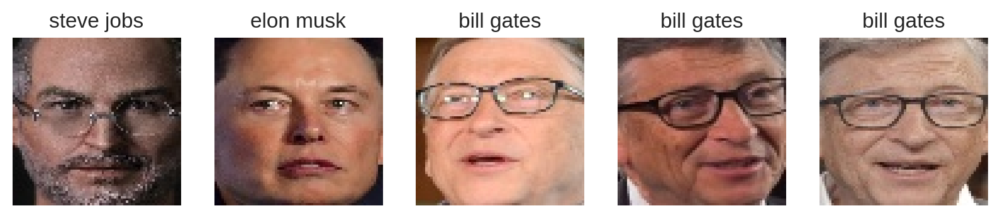

Dataset ImageFolder
    Number of datapoints: 914
    Root location: /content/data/valid/


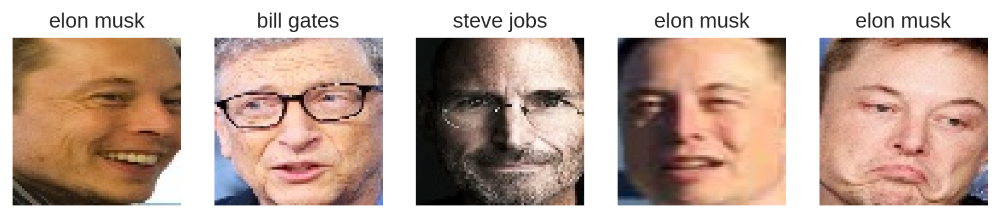

In [12]:
plot_samples(train_dataset)
plot_samples(valid_dataset)

**Примечание:** странно, что количество картинок в тренировочной выборке не совпадает с количеством файлов (3000 и 3001 соответственно)

In [13]:
print(train_dataset.classes)
print(train_dataset.samples[1])
print(train_dataset.samples[-1])

['bill_gates', 'elon_musk', 'jeff_bezos', 'mark_zuckerberg', 'steve_jobs']
('/content/data/train/bill_gates/00715f3e-b281-4199-91c7-7da7a8475d7b.jpg', 0)
('/content/data/train/steve_jobs/ddffade7-febb-47c8-a9c6-85700d1afcd9.jpg', 4)


## 2. Обработка данных перед загрузкой в модель

### 2.1. Определим размер батча и Device

In [14]:
BATCH_SIZE = 24
DEVICE = "cuda"
# DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### 2.2. Нормализация и аугментация данных

In [15]:
# нормализация цвета
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])

train_dataset.transform = transforms.Compose([
    # вырезаем не просто центр из изображения, приведённого к нужному размеру,
    # но и части из разных областей изображения — при этом изображение случайным образом изменяет свой размер
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(), # изображение отражается слева направо случайным образом
    transforms.ToTensor(),
    normalize # нормализация цвета (см. выше)
])
valid_dataset.transform = transforms.Compose([
    transforms.Resize(256), # меняем размер изображения
    transforms.CenterCrop(224), # вырезаем центр из изображения
    transforms.ToTensor(),
    normalize # нормализация цвета (см. выше)
])

### 2.3. Определите также даталоадеры для обучения и валидации

In [16]:
train_loader = torch.utils.data.DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True,
    num_workers=os.cpu_count() # количество фоновых процессов, которые будут предобрабатывать данные (= кол-ву ядер процессора)
)

valid_loader = torch.utils.data.DataLoader(
    valid_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=os.cpu_count()
)

### 2.4. Проверим отработку нормализации и аугментации на тренировочном и валидационном даталоадерах

['jeff_bezos', 'steve_jobs', 'elon_musk', 'jeff_bezos', 'elon_musk', 'mark_zuckerberg', 'bill_gates', 'steve_jobs']
['mark_zuckerberg', 'mark_zuckerberg', 'steve_jobs', 'jeff_bezos', 'steve_jobs', 'jeff_bezos', 'elon_musk', 'jeff_bezos']
['steve_jobs', 'mark_zuckerberg', 'elon_musk', 'jeff_bezos', 'steve_jobs', 'steve_jobs', 'elon_musk', 'jeff_bezos']


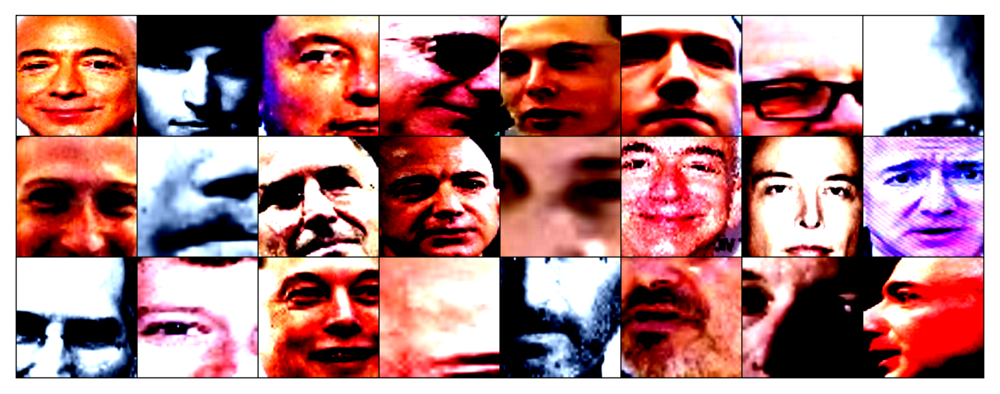

In [17]:
# получим картинки и метки класса
data, labels = next(iter(train_loader))
# делаем  необходимые преобразования с изображениями
img = torchvision.utils.make_grid(data)
img = img.numpy().transpose((1,2,0))

# получаем названия классов
classes = train_dataset.classes

# выведем названия классов, как на полученном изображении
print([classes[i] for i in labels][:8])
print([classes[i] for i in labels][8:16])
print([classes[i] for i in labels][16:])

# выводим батч в виде изображения
plt.xticks([])
plt.yticks([])
plt.imshow(img)
plt.show;

['jeff_bezos', 'mark_zuckerberg', 'elon_musk', 'jeff_bezos', 'jeff_bezos', 'elon_musk', 'mark_zuckerberg', 'bill_gates']
['mark_zuckerberg', 'bill_gates', 'elon_musk', 'mark_zuckerberg', 'mark_zuckerberg', 'bill_gates', 'mark_zuckerberg', 'jeff_bezos']
['elon_musk', 'mark_zuckerberg', 'elon_musk', 'elon_musk', 'jeff_bezos', 'bill_gates', 'mark_zuckerberg', 'bill_gates']


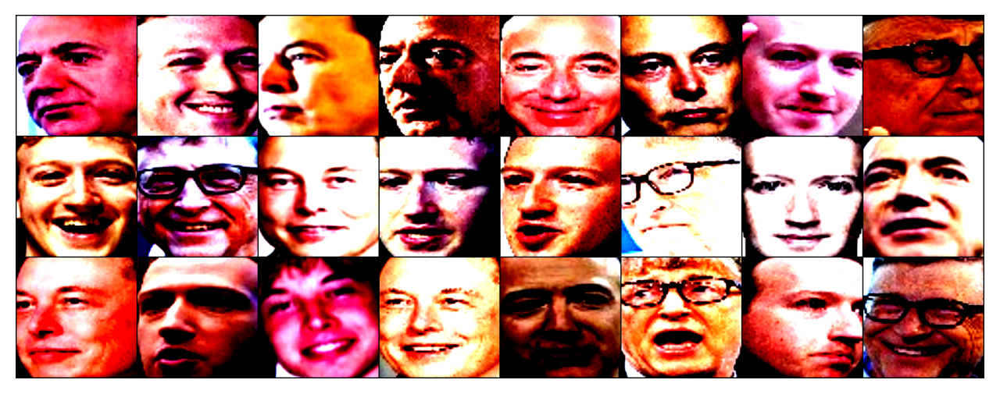

In [18]:
# получим картинки и метки класса
data, labels = next(iter(valid_loader))
# делаем  необходимые преобразования с изображениями
img = torchvision.utils.make_grid(data)
img = img.numpy().transpose((1,2,0))

# получаем названия классов
classes = valid_dataset.classes

# выведем названия классов, как на полученном изображении
print([classes[i] for i in labels][:8])
print([classes[i] for i in labels][8:16])
print([classes[i] for i in labels][16:])

# выводим батч в виде изображения
plt.xticks([])
plt.yticks([])
plt.imshow(img)
plt.show;

## 3. Работа с моделью

### 3.1. Загрузим предобученную модель ResNet-34 и выведем ее слои

In [19]:
celebrities_model = models.resnet34(weights = True)

print(celebrities_model)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 170MB/s]

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

### 3.2. Напишем функцию для обучения модели

In [20]:
def train_model(net, optimizer, train_loader, valid_loader, device, num_epochs=10):
    """
    Функция принимает на вход модель, оптимизатор, тренировочный и валидационный даталоадеры,
    device, кол-во эпох для обучения. После окончания обучения выводит значения функции потерь
    и точность для тренировочной и валидационной выборок для каждой эпохи
    """

    loss_train = []
    top1_train = []
    loss_valid = []
    top1_valid = []

    for epoch in range(num_epochs):
        # переключаем torch в режим сохрания данных для рассчета градиентов
        torch.set_grad_enabled(True)
        # переключаем модель в режим обучения для хранения промежуточной информация
        net.train()

        losses = []
        equals = []

        for i, (images, target) in enumerate(tqdm(train_loader)):
            # переносим на GPU при возможности
            images = images.to(device)
            target = target.to(device)

            # считаем сырые предсказания и функцию потерь
            output = net(images)
            loss = criterion(output, target)

            # запоминаем функцию потерь и правильность предсказаний
            losses.append(loss.item())
            equals.extend([eq.item() for eq in output.argmax(1) == target])

            # делаем шаг обновления весов модели
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        loss_train.append(np.mean(losses))
        top1_train.append(np.mean(equals))

        # для валидации градиенты не нужны
        torch.set_grad_enabled(False)
        # переключаем модель в режим валидации (быстрее, не храним ничего лишнего)
        net.eval()

        losses = []
        equals = []

        for i, (images, target) in enumerate(tqdm(valid_loader)):
            # переносим на GPU при возможности
            images = images.to(device)
            target = target.to(device)

            # считаем сырые предсказания и функцию потерь
            output = net(images)
            loss = criterion(output, target)

            # запоминаем функцию потерь и правильность предсказаний
            losses.append(loss.item())
            equals.extend([eq.item() for eq in output.argmax(1) == target])

            # шаг обновления весов здесь не нужен
            ...

        loss_valid.append(np.mean(losses))
        top1_valid.append(np.mean(equals))

        # если обучение закончено, визуализируем результаты
        if len(loss_train) == num_epochs:
            plt.figure(figsize=(10, 4))

            plt.subplot(121)
            plt.plot(range(1, len(loss_train) + 1), loss_train, color="b")
            plt.plot(range(1, len(loss_train) + 1), loss_valid, color="r")
            plt.xlabel("Номер эпохи")
            plt.legend(['Train', 'Valid'], loc='best')
            plt.title("Функция потери")

            plt.subplot(122)
            plt.plot(range(1, len(loss_train) + 1), top1_train, color="b")
            plt.plot(range(1, len(loss_train) + 1), top1_valid, color="r")
            plt.xlabel("Номер эпохи")
            plt.legend(['Train', 'Valid'], loc='best')
            plt.title("Точность")

            plt.show()

### 3.3. Итерация №1
- заморозим веса всех слоев модели
- отредактируем последний слой классификатора, заменив кол-во классов на нужное нам
- функция потерь CrossEntropyLoss
- оптимизатор Adam

In [21]:
# замораживаем веса модели
for param in celebrities_model.parameters():
    param.requires_grad = False

# правим последний слой классификатора
celebrities_model.fc = torch.nn.Linear(512, len(train_dataset.classes))

# функция потерь и оптимизатор
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(celebrities_model.parameters())

In [22]:
# загрузим модель на GPU
celebrities_model = celebrities_model.to(DEVICE)
criterion = criterion.to(DEVICE)

100%|██████████| 39/39 [00:01<00:00, 37.18it/s]


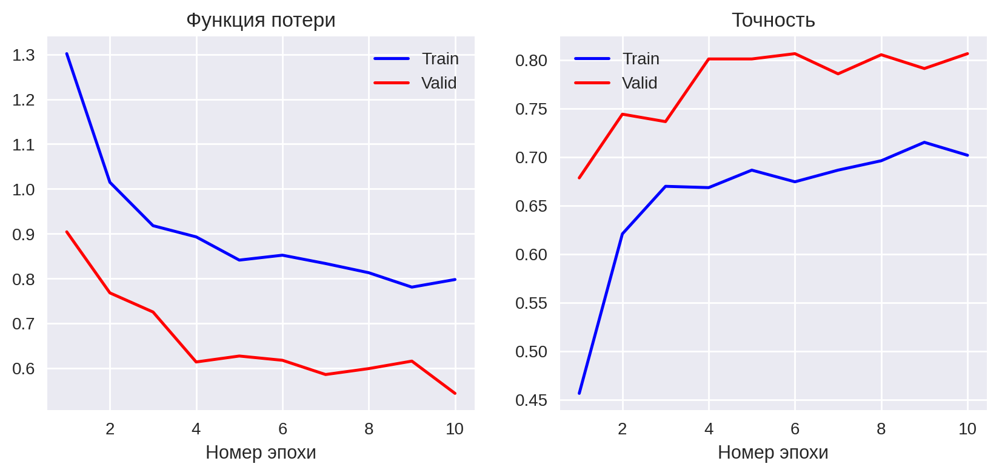

In [23]:
# обучаем модель
train_model(celebrities_model, optimizer, train_loader, valid_loader, DEVICE, 10)

**Выводы:**
- метрики на валидации лучше, чем на тренировочной выборке
- мы не достигли показателя точности = 0.85 на валидации
- возможно, результаты будут лучше, если увеличить количество эпох обучения, т.к. графики значений функции потерь снижаются, а графики значений точности растут

### 3.4. Итерация №2
- правим классификатор модели и размораживаем его веса

In [24]:
# правим классификатор
celebrities_model.fc = torch.nn.Sequential(
    torch.nn.Flatten(), torch.nn.Linear(512, out_features = 256),
    torch.nn.ReLU(),
    torch.nn.Linear(256, 128),
    torch.nn.Softmax(1),
    torch.nn.Linear(128, len(train_dataset.classes)))

# размораживаем веса нового классификатора
for index, param in enumerate(celebrities_model.parameters()):
    if index >= (len(list(celebrities_model.parameters())) - 5):
        param.requires_grad = True

# функция потерь и оптимизатор
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(celebrities_model.parameters())

In [25]:
# очистим сессию
clear_session()

# загрузим модель на GPU
celebrities_model = celebrities_model.to(DEVICE)
criterion = criterion.to(DEVICE)

100%|██████████| 39/39 [00:01<00:00, 36.49it/s]


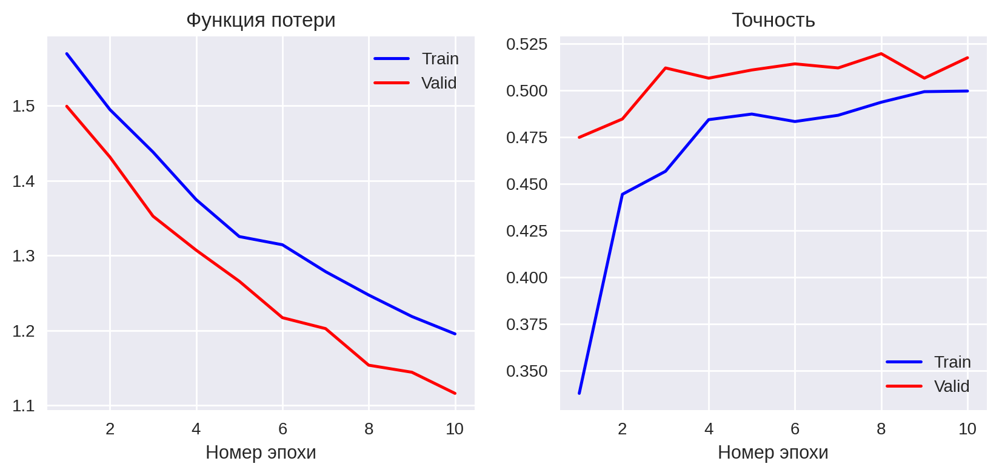

In [26]:
# обучаем модель
train_model(celebrities_model, optimizer, train_loader, valid_loader, DEVICE, 10)

**Выводы:**
- в конце обучения метрики на тренировочной и валидационой выборках сближаются, однака метрики валидации выше, чем при обучения
- однако, результаты стали хуже и мы не достигли показателя точности = 0.85 на валидации

### 3.5. Итерация №3
- возвращаем старый классификатор модели, учитывая нужное нам количество классов
- размораживаем веса модели от 89 слоя и выше

In [27]:
# правим классификатор
celebrities_model.fc = torch.nn.Linear(512, len(train_dataset.classes))

# частично размораживаем веса модели
for index, param in enumerate(celebrities_model.parameters()):
    if index >= 89:
        param.requires_grad = True

# функция потерь и оптимизатор
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(celebrities_model.parameters())

In [28]:
# очистим сессию
clear_session()

# загрузим модель на GPU
celebrities_model = celebrities_model.to(DEVICE)
criterion = criterion.to(DEVICE)

100%|██████████| 39/39 [00:01<00:00, 35.04it/s]


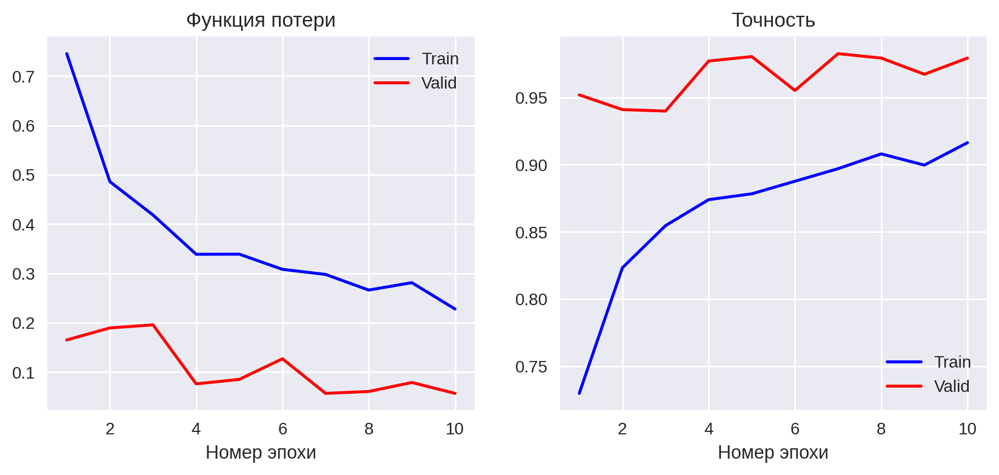

In [29]:
# обучаем модель
train_model(celebrities_model, optimizer, train_loader, valid_loader, DEVICE, 10)

**Выводы:**
- метрики на валидации снова лучше, чем на тренировочной выборке
- мы достигли показателя точности более 0.85 на валидации и на тренировочной выборках

## 4. Проверка обученной модели

### 4.1. Проверка на валидационном датасете

Напишем функцию для проверки работы модели на валидации

In [30]:
def visualize_predictions_valid(model, dataloader, device):
    """
    Функция принимает на вход модель, даталоадер, имя устройства для работы,
    возвращает 10 картинок с предсказанными и реальными названиями классов
    """
    # получаем из даталоадера картинки и метки
    data, labels = next(iter(dataloader))
    # получаем 10 картинок и меток
    data, labels = data[:10].to(device), labels[:10]
    # по картинке предсказываем класс
    predictions = model(data).max(1)[1]

    predictions, data = predictions.cpu(), data.cpu()

    # перечень названий классов
    classes = train_dataset.classes

    # выводим искомые данные
    plt.figure(figsize=(16,9))
    for i in range(10):
        class_digit_predict = predictions[i].item() # получаем метку предсказанного класса
        class_name_predict = classes[class_digit_predict] # получаем сам класс (имя персоны)
        class_name_real = classes[labels[i]] # получаем реальную метку класса и сам класс (имя персоны)

        # выводим искомые данные
        img = data.squeeze(1)[i]
        img = img.numpy().transpose((1,2,0))
        plt.subplot(1, 10, i+1)
        plt.imshow(img)
        plt.xlabel(f"{class_name_predict}\n{class_name_real}", fontsize=9)
        plt.xticks([])
        plt.yticks([])
    plt.show()

    print("Верхняя строчка - предсказание модели")
    print("Нижняя строчка - настоящий класс изображения")

In [31]:
# загрузим модель на GPU
celebrities_model = celebrities_model.to(DEVICE)

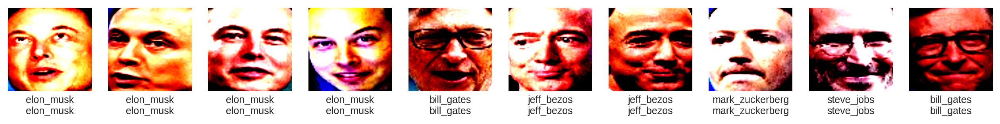

Верхняя строчка - предсказание модели
Нижняя строчка - настоящий класс изображения


In [32]:
# визуализируем предсказания по 10 валидационным картинкам
visualize_predictions_valid(celebrities_model, valid_loader, DEVICE)

### 4.2. Проверка на картинках с интернета (возьмем 1 картинку для каждого персонажа)

Напишем функцию для проверки работы модели на случайных картинках из интернета

In [43]:
def visualize_predictions_test(model, files_paths, device):
    """
    Функция принимает на вход модель, пути к файлам изображений в виде списка, а также устройство,
    куда загружена модель. Выводит вероятности принадлежности к классам, сами изображения и предсказанные названия классов.
    """

    # задаем фигуру
    plt.figure(figsize=(16,3))
    for i in range(len(files_paths)):
        # получаем путь к картинке и загружаем ее
        path = files_paths[i]
        image = Image.open(path)

        # преобразуем картинку, добавляем в батч и получаем предсказание
        tensor = valid_dataset.transform(image)
        batch = torch.stack([tensor])
        predicted = model(batch.to(device)).max(1)[1]


        # выводим искомые данные
        print(f"Изображение {i+1}, вероятности: {model(batch.to(device))[0]}")
        plt.subplot(1, len(files_paths), i+1)
        plt.imshow(image)
        plt.xlabel(f"{train_dataset.classes[predicted]}".replace("_", " "), fontsize=18)
        plt.xticks([])
        plt.yticks([])
    plt.show()

Попробуем опознать знменитостей по картинкам из интернета

Изображение 1, вероятности: tensor([ 1.6382,  0.3729, -0.6530, -0.5607, -3.5951], device='cuda:0')
Изображение 2, вероятности: tensor([-2.2450,  3.0869,  1.0107, -1.3282, -3.1966], device='cuda:0')
Изображение 3, вероятности: tensor([-1.7120, -0.2816,  2.3631, -1.5112, -1.9120], device='cuda:0')
Изображение 4, вероятности: tensor([ 0.5420,  0.1088, -0.0200,  0.0840, -3.2709], device='cuda:0')
Изображение 5, вероятности: tensor([-2.5508, -0.8085,  0.5814, -2.7950,  2.5166], device='cuda:0')


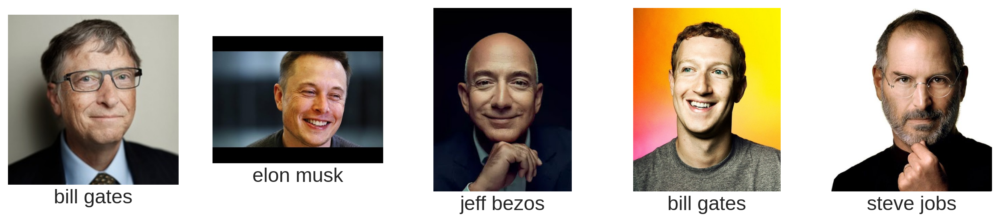

In [44]:
# получаем пути к файлам изображений
files_paths_test = [os.path.abspath(os.path.join(PATH_TEST, p)) for p in os.listdir(PATH_TEST) if p.endswith(('jpg', 'jpeg'))]

# визуализируем картинки и предсказания
visualize_predictions_test(celebrities_model, files_paths_test, DEVICE)

## 5. Выводы
- для решения задачи использована предобученная сеть ResNet-34
- проведены эксперименты и выполнена тонкая настройка сети
- получены значения точности более 0.9 на обеих выборках
- при получении предсказаний для картинок не входящих в изначальный набор данных, получены следующие результаты: из 5 случайных картинок сеть правильно определила 4 персонажей (при разных прогонах сеть определяет правильно от 2 до 4 представвленных персонажей)

## 7. Решение (версия №2)
- будем использовать дополнительные инструменты:
  - pytorch_lightning
  - tensorboard
- разморозим все веса модели
- оптимизатор Adam
- заменим последний слой классификатора с учетом количества классов для нашей задачи
- увеличим количество эпох до 30

### 7.1. Установим и импортируем дополнительные модули и библиотеки

In [45]:
%%capture
!pip install pytorch_lightning

In [46]:
import pytorch_lightning as pl
from torch.nn import functional as F
from torch.utils.data import DataLoader

%load_ext tensorboard

print(f"Pytorch Lightning version: {pl.__version__}")

Pytorch Lightning version: 2.1.3


### 7.2. Определим класс нашей модели на основе предобученной ResNet-34

In [47]:
class CelebritiesModel(pl.LightningModule):

    def __init__(self):
        super().__init__()

        # используем предобученную модель ResNet-34
        self.net = models.resnet34(pretrained=True)

        # размораживаем веса
        for parameter in self.net.parameters():
            parameter.requres_grad = True

        # заменяем полносвязный слой на новый под нужное количество классов
        self.net.fc = torch.nn.Linear(512, len(train_dataset.classes))

    # вызов модуля
    def forward(self, x):
        return self.net(x)

    # шаг обучения
    def training_step(self, batch, batch_nb):
        images, target = batch
        output = self(images)
        # используем "функциональную" версию функции потерь вместо инстанцирования модуля
        loss = F.cross_entropy(output, target)
        with torch.no_grad():
            top1 = torch.mean((output.argmax(1) == target).float()).item()

        # логируем метрики — они будут как в прогрессбаре внизу, так и в отдельной директории
        self.log('loss/train', loss, on_step=False, on_epoch=True)
        self.log('top1/train', top1, on_step=False, on_epoch=True, prog_bar=True)

        # нужно вернуть основное значение лосса (функции потерь)
        return loss

    def validation_step(self, batch, batch_idx):

        images, target = batch ###

        output = self(images) ###
        loss = F.cross_entropy(output, target) ###
        top1 = torch.mean((output.argmax(1) == target).float()).item() ###

        self.log('loss/val', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log('top1/val', top1, on_step=False, on_epoch=True, prog_bar=True)

    # используемые оптимизаторы
    def configure_optimizers(self):
        return torch.optim.SGD(self.net.parameters(), lr=1e-2, weight_decay=1e-4)

### 7.3. Проведем обучение и ознакомимся с результатами в Tensorboard

In [48]:
# Инициализируем модель
celebrities_model_v2 = CelebritiesModel()

# Инициализируем обучатель
trainer = pl.Trainer(
    # используем 1 видеокарту
    devices=1, accelerator="gpu",
    # обучаем в течение 30-ти эпох
    max_epochs=30
)

# Обучаем модель обучателем на нашем датасете
trainer.fit(celebrities_model_v2, train_loader, valid_loader)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:You are us

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:492: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.


In [49]:
%tensorboard --logdir lightning_logs

Output hidden; open in https://colab.research.google.com to view.

На GitHub tensorboard не отображается. Прикрепляю картинку.

<image src="tensorboard.png" alt="tensorboard" width="600">

### 7.4. Проверим модель на валидационном наборе данных

In [50]:
# загрузим модель на GPU
celebrities_model_v2 = celebrities_model_v2.to(DEVICE)

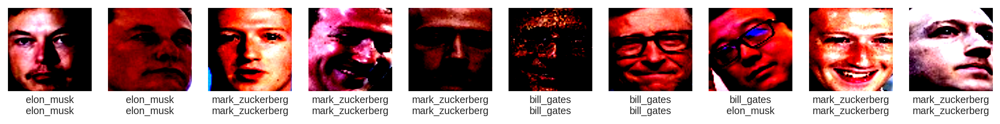

Верхняя строчка - предсказание модели
Нижняя строчка - настоящий класс изображения


In [51]:
# визуализируем предсказания по 10 валидационным картинкам
visualize_predictions_valid(celebrities_model_v2, valid_loader, DEVICE)

### 7.5. Проверим модель на тестовом наборе данных (картинки из интернета)

Изображение 1, вероятности: tensor([ 0.1332,  0.5955,  0.4928, -0.1687, -0.2590], device='cuda:0',
       grad_fn=<SelectBackward0>)
Изображение 2, вероятности: tensor([ 0.0363,  0.5381,  0.4136, -0.2089, -0.1736], device='cuda:0',
       grad_fn=<SelectBackward0>)
Изображение 3, вероятности: tensor([-0.0324,  0.4409,  0.5506, -0.2472, -0.0788], device='cuda:0',
       grad_fn=<SelectBackward0>)
Изображение 4, вероятности: tensor([ 0.1761,  0.5401,  0.3957, -0.2468, -0.1115], device='cuda:0',
       grad_fn=<SelectBackward0>)
Изображение 5, вероятности: tensor([ 0.1012,  0.5005,  0.4047, -0.1677, -0.1727], device='cuda:0',
       grad_fn=<SelectBackward0>)


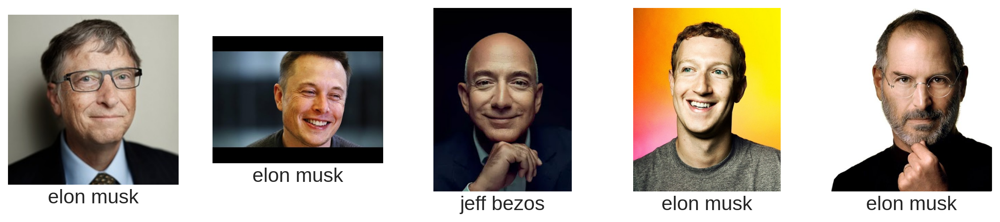

In [52]:
# получаем пути к файлам изображений
files_paths_test = [os.path.abspath(os.path.join(PATH_TEST, p)) for p in os.listdir(PATH_TEST) if p.endswith(('jpg', 'jpeg'))]

# визуализируем картинки и предсказания
visualize_predictions_test(celebrities_model_v2, files_paths_test, DEVICE)

In [43]:
# сохраним зависимости
!pip freeze > requirements.txt

### 7.6. Выводы:
- результаты по метрикам лучше, чем результаты в предыдущей версии решения:
  - точность на train >0.96
  - точность на valid >0.99
- однако смущает 2 момента:
  - если в предыдущем решении на валидационной выборке сеть угадала все изображения (10/10), то в этом решении только 9 из 10.
  - на тестовом наборе картинок, скачанных из интернета сеть отрабатывает хуже, чем модель в предыдущей версии решения (1-3 из 5)
- во втором варианте решения я что-то сделал не так, к сожалению не смог найти ошибку :(
- мне остается непонятно, почему на валидации метрики лучше, чем на тренировочной выборке ???, ведь, по идее, должно быть наоборот...